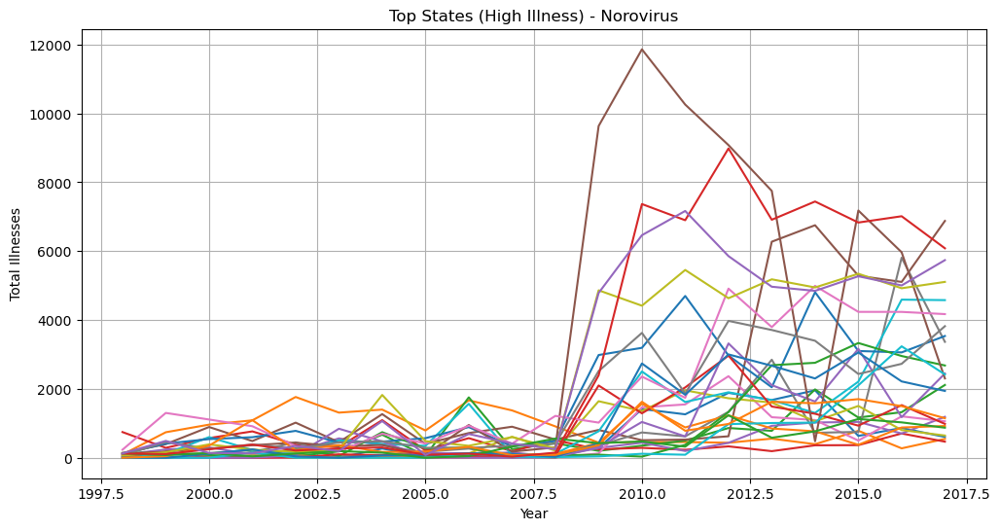

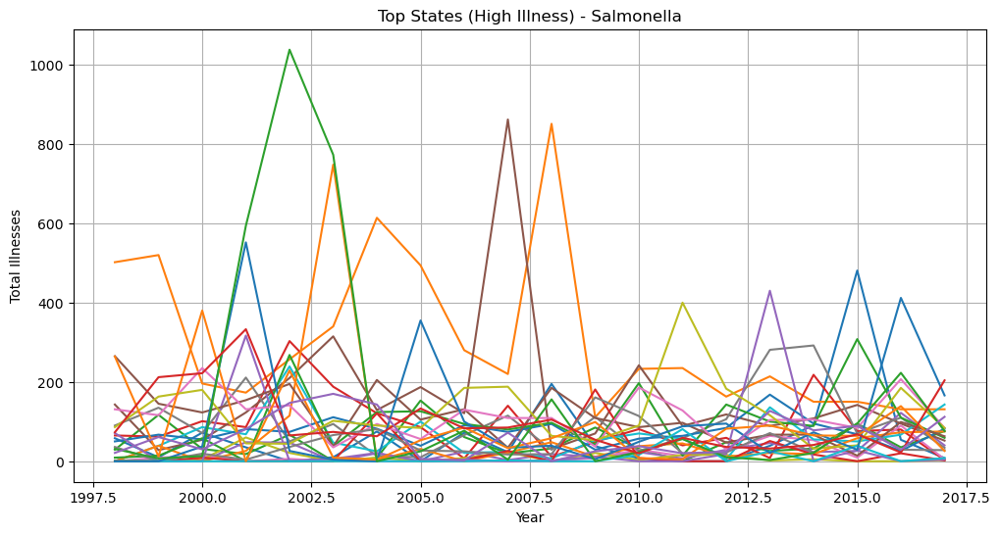

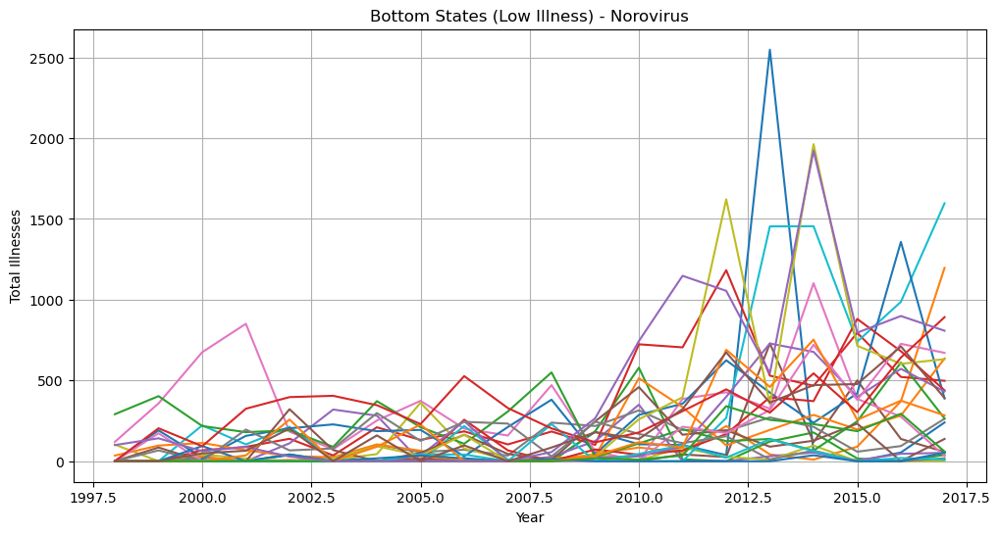

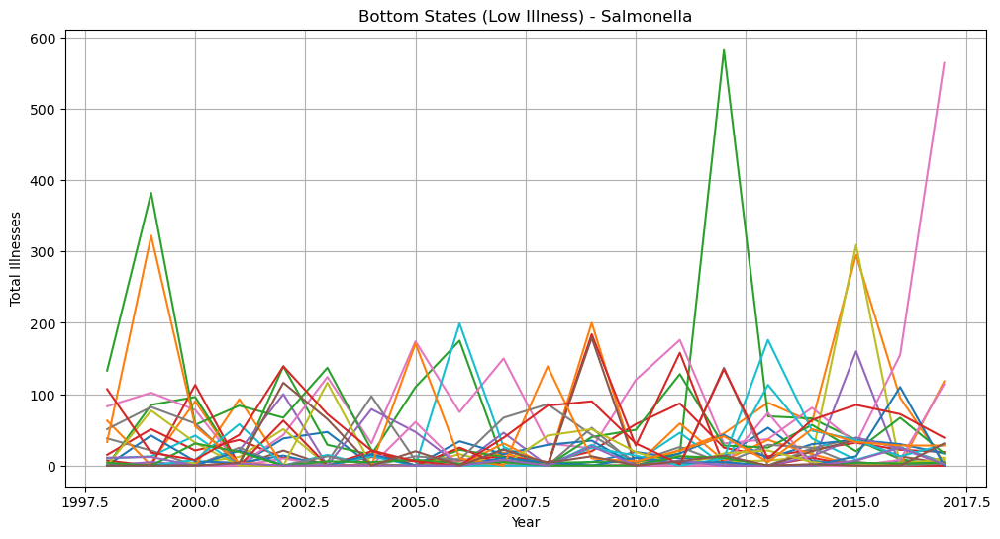

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
%matplotlib inline

# Load data
df = pd.read_csv(r"C:\Users\Avilaaa\OneDrive - UT Arlington\Documents\ValkyrieTA_Angela_Avila\food_outbreaks\NationalOutbreak_OutbreakData.csv")

# Core setup
state_abbrev = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ', 'Arkansas': 'AR',
    'California': 'CA', 'Colorado': 'CO', 'Connecticut': 'CT', 'Delaware': 'DE',
    'Florida': 'FL', 'Georgia': 'GA', 'Hawaii': 'HI', 'Idaho': 'ID',
    'Illinois': 'IL', 'Indiana': 'IN', 'Iowa': 'IA', 'Kansas': 'KS',
    'Kentucky': 'KY', 'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD',
    'Massachusetts': 'MA', 'Michigan': 'MI', 'Minnesota': 'MN', 'Mississippi': 'MS',
    'Missouri': 'MO', 'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV',
    'New Hampshire': 'NH', 'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY',
    'North Carolina': 'NC', 'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK',
    'Oregon': 'OR', 'Pennsylvania': 'PA', 'Rhode Island': 'RI', 'South Carolina': 'SC',
    'South Dakota': 'SD', 'Tennessee': 'TN', 'Texas': 'TX', 'Utah': 'UT',
    'Vermont': 'VT', 'Virginia': 'VA', 'Washington': 'WA', 'West Virginia': 'WV',
    'Wisconsin': 'WI', 'Wyoming': 'WY', 'Washington DC': 'DC'
}

df['State Abbrev'] = df['State'].map(state_abbrev)
# Clean Etiology column first (avoid issues with NaNs)
df = df.dropna(subset=['Etiology'])

# Clean data
df = df.dropna(subset=['Etiology'])
df['Etiology First Word'] = df['Etiology'].str.split().str[0]
df['Illnesses'] = pd.to_numeric(df['Illnesses'], errors='coerce')

# Keep only the two etiologies
df = df[df['Etiology First Word'].isin(['Norovirus', 'Salmonella'])]

# Aggregate illnesses
agg = df.groupby(['State Abbrev', 'Year', 'Etiology First Word'])['Illnesses'].sum().reset_index()

# --- Create full grid to fill missing years with 0 ---
all_states = agg['State Abbrev'].dropna().unique()
all_years = np.arange(agg['Year'].min(), agg['Year'].max() + 1)
all_etiologies = ['Norovirus', 'Salmonella']

full_index = pd.MultiIndex.from_product(
    [all_states, all_years, all_etiologies],
    names=['State Abbrev', 'Year', 'Etiology First Word']
)

agg_full = agg.set_index(['State Abbrev', 'Year', 'Etiology First Word']) \
              .reindex(full_index, fill_value=0) \
              .reset_index()

# --- Rank states by total illnesses ---
state_totals = agg_full.groupby('State Abbrev')['Illnesses'].sum().sort_values(ascending=False)

# Split into top half and bottom half
midpoint = len(state_totals) // 2
top_states = state_totals.iloc[:midpoint].index
bottom_states = state_totals.iloc[midpoint:].index

# Function to plot
def plot_group(states, etiology, title):
    data = agg_full[
        (agg_full['State Abbrev'].isin(states)) &
        (agg_full['Etiology First Word'] == etiology)
    ]
    
    pivot = data.pivot(index='Year', columns='State Abbrev', values='Illnesses')
    
    plt.figure(figsize=(12,6))
    
    for state in pivot.columns:
        plt.plot(pivot.index, pivot[state])
    
    plt.title(title)
    plt.xlabel('Year')
    plt.ylabel('Total Illnesses')
    plt.grid(True)
    plt.show()

# --- 4 PLOTS ---

# 1. Top states - Norovirus
plot_group(top_states, 'Norovirus', 'Top States (High Illness) - Norovirus')

# 2. Top states - Salmonella
plot_group(top_states, 'Salmonella', 'Top States (High Illness) - Salmonella')

# 3. Bottom states - Norovirus
plot_group(bottom_states, 'Norovirus', 'Bottom States (Low Illness) - Norovirus')

# 4. Bottom states - Salmonella
plot_group(bottom_states, 'Salmonella', 'Bottom States (Low Illness) - Salmonella')

In [2]:
# --- Function to create interactive plots ---
def plot_group_interactive(states, etiology, title):
    data = agg_full[
        (agg_full['State Abbrev'].isin(states)) &
        (agg_full['Etiology First Word'] == etiology)
    ]
    
    pivot = data.pivot(index='Year', columns='State Abbrev', values='Illnesses')
    
    fig = go.Figure()
    
    for state in pivot.columns:
        fig.add_trace(go.Scatter(
            x=pivot.index,
            y=pivot[state],
            mode='lines+markers',
            name=state,
            hovertemplate=
                'State: %{text}<br>' +
                'Year: %{x}<br>' +
                'Illnesses: %{y}<extra></extra>',
            text=[state]*len(pivot.index)
        ))
    
    fig.update_layout(
        title=title,
        xaxis_title='Year',
        yaxis_title='Total Illnesses',
        hovermode='closest',
        legend_title='State'
    )
    
    fig.show()


# --- 4 INTERACTIVE PLOTS ---

# 1. Top states - Norovirus
plot_group_interactive(top_states, 'Norovirus',
                       'Top States - Norovirus')

# 2. Top states - Salmonella
plot_group_interactive(top_states, 'Salmonella',
                       'Top States - Salmonella')

# 3. Bottom states - Norovirus
plot_group_interactive(bottom_states, 'Norovirus',
                       'Bottom States - Norovirus')

# 4. Bottom states - Salmonella
plot_group_interactive(bottom_states, 'Salmonella',
                       'Bottom States - Salmonella')

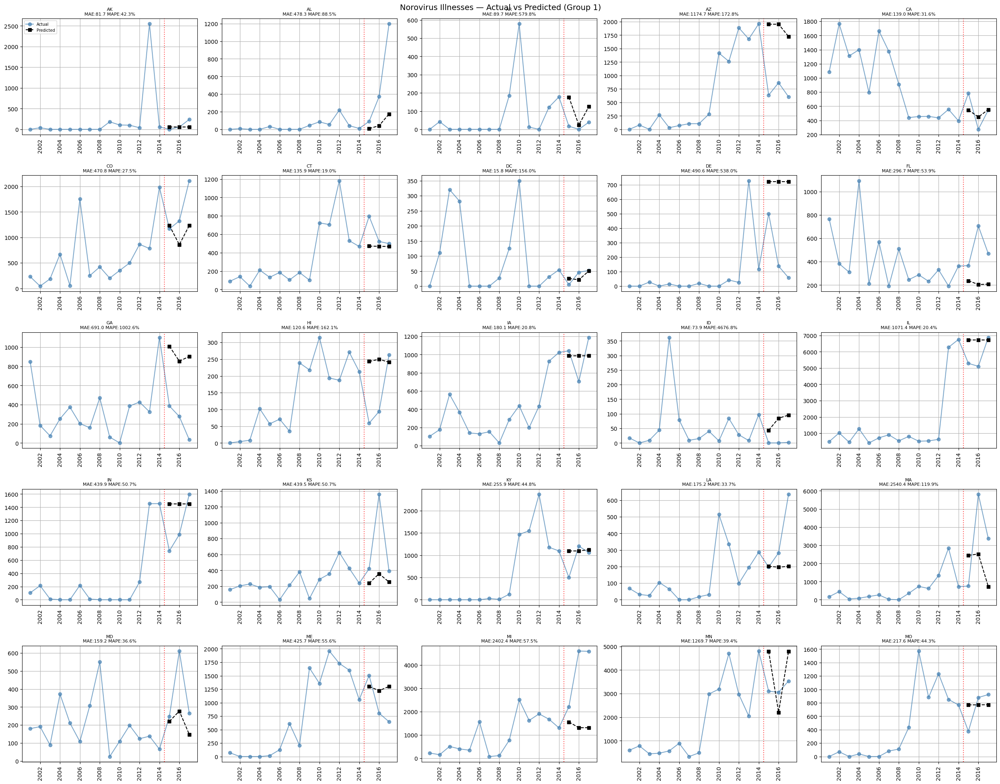

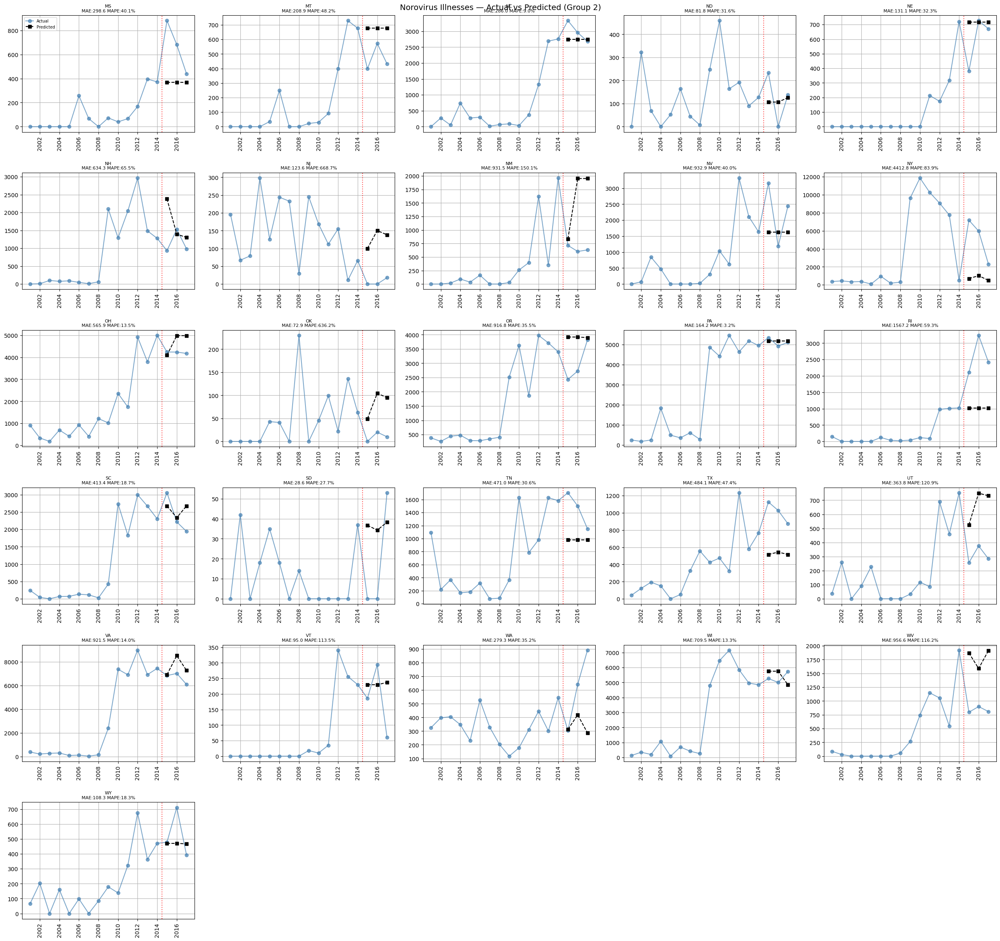

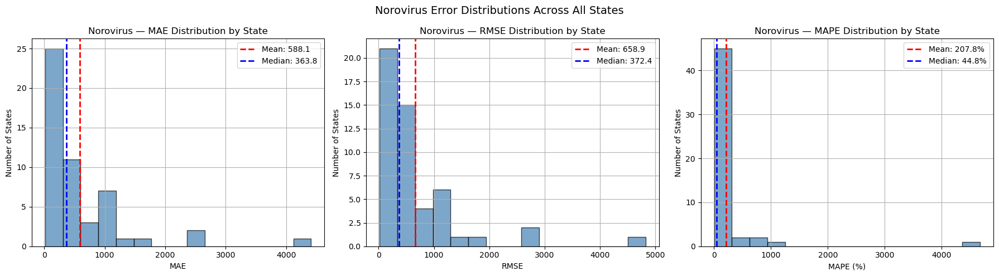


Norovirus Model Performance:
MAE  — Mean: 588.14  Median: 363.80
RMSE — Mean: 658.91  Median: 372.36
MAPE — Mean: 207.81%  Median: 44.84%
MAPE calculated for 51/51 states
Best state  (lowest MAE):  DC — MAE: 15.77
Worst state (highest MAE): NY — MAE: 4412.80


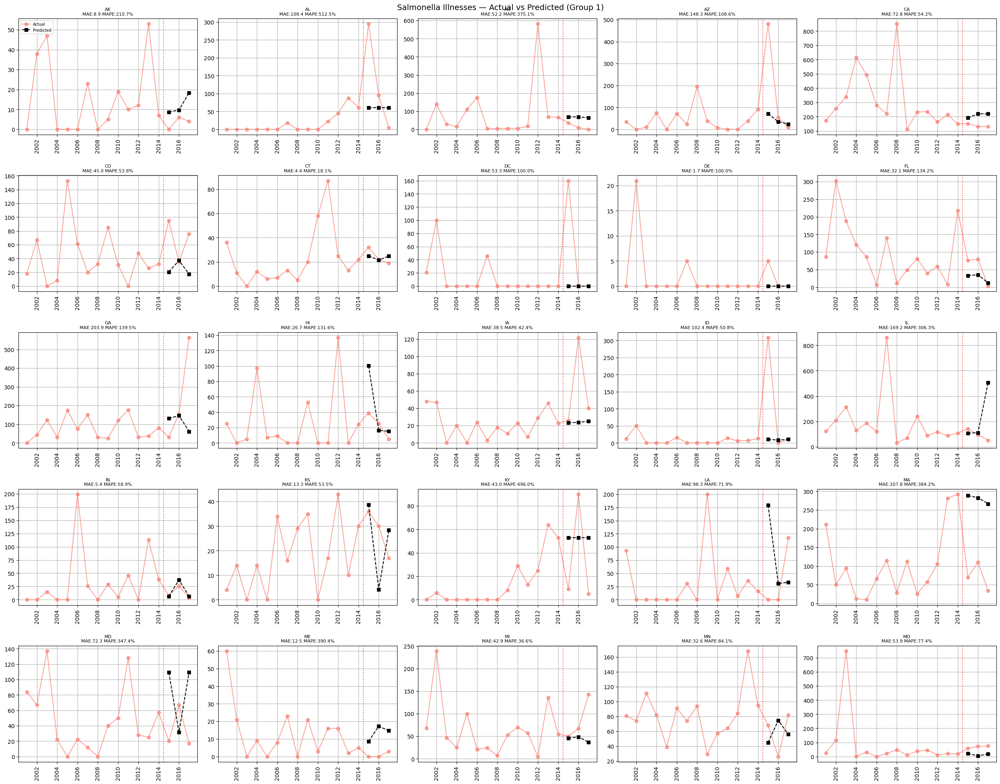

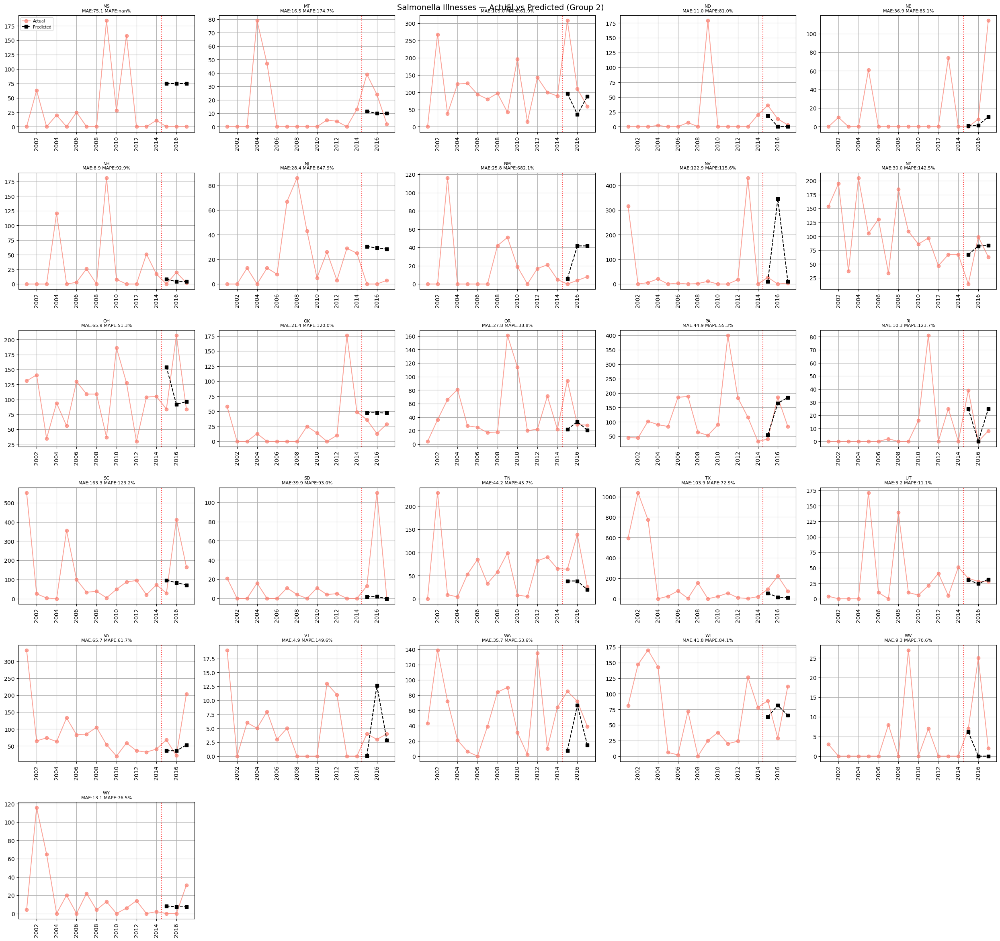

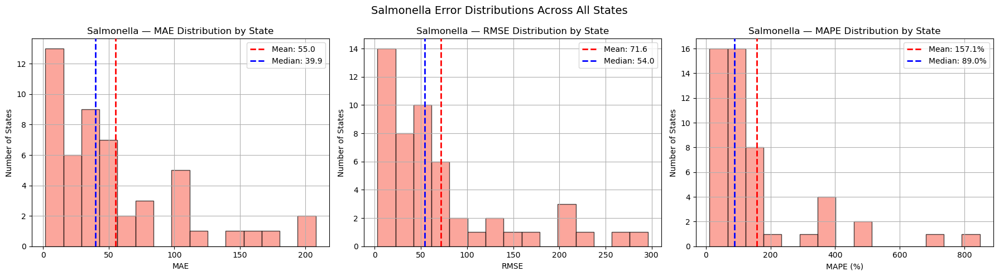


Salmonella Model Performance:
MAE  — Mean: 55.01  Median: 39.90
RMSE — Mean: 71.63  Median: 54.02
MAPE — Mean: 157.05%  Median: 88.99%
MAPE calculated for 50/51 states
Best state  (lowest MAE):  DE — MAE: 1.67
Worst state (highest MAE): MA — MAE: 207.84


In [3]:
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
import numpy as np
warnings.filterwarnings('ignore')

def run_state_models(agg_full, etiology, color, all_years):
    
    results = {}
    states = sorted(agg_full['State Abbrev'].dropna().unique())
    
    for state in states:
        state_data = agg_full[
            (agg_full['State Abbrev'] == state) & 
            (agg_full['Etiology First Word'] == etiology)
        ].sort_values('Year').reset_index(drop=True)
        
        state_data['Lag 1'] = state_data['Illnesses'].shift(1)
        state_data['Lag 2'] = state_data['Illnesses'].shift(2)
        state_data['Lag 3'] = state_data['Illnesses'].shift(3)
        state_data['Rolling Avg 3'] = state_data['Illnesses'].shift(1).rolling(3).mean()
        state_data['Trend'] = state_data['Lag 1'] - state_data['Lag 2']
        state_data = state_data.dropna().reset_index(drop=True)
        
        if len(state_data) < 5:
            continue
        
        features = ['Year', 'Lag 1', 'Lag 2', 'Lag 3', 'Rolling Avg 3', 'Trend']
        train = state_data[state_data['Year'] <= 2014]
        test = state_data[state_data['Year'] > 2014]
        
        if len(train) < 3 or len(test) < 1:
            continue
        
        X_train = train[features]
        y_train = train['Illnesses']
        X_test = test[features]
        y_test = test['Illnesses']
        
        model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1,
                                   max_depth=3, random_state=42, verbosity=0)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        
        # Relative error — avoid division by zero
        relative_errors = np.where(
            y_test.values != 0,
            np.abs(y_test.values - y_pred) / y_test.values * 100,
            np.nan
        )
        
        results[state] = {
            'actual': y_test.values,
            'predicted': y_pred,
            'years': test['Year'].values,
            'mae': mean_absolute_error(y_test, y_pred),
            'rmse': mean_squared_error(y_test, y_pred) ** 0.5,
            'relative_errors': relative_errors,
            'mape': np.nanmean(relative_errors),
            'full_data': state_data
        }
    
    # --- Actual vs Predicted Plots ---
    states_with_results = list(results.keys())
    midpoint = len(states_with_results) // 2
    group1 = states_with_results[:midpoint]
    group2 = states_with_results[midpoint:]
    
    for group_num, group in enumerate([group1, group2], 1):
        cols = 5
        rows = -(-len(group) // cols)
        fig, axes = plt.subplots(rows, cols, figsize=(25, rows * 4))
        axes = axes.flatten()
        
        for i, state in enumerate(group):
            r = results[state]
            full = r['full_data']
            axes[i].plot(full['Year'], full['Illnesses'],
                        marker='o', color=color, label='Actual', alpha=0.7)
            axes[i].plot(r['years'], r['predicted'],
                        marker='s', color='black', linestyle='dashed', label='Predicted')
            axes[i].axvline(x=2014.5, color='red', linestyle='dotted', alpha=0.7)
            axes[i].set_title(f"{state}\nMAE:{r['mae']:.1f} MAPE:{r['mape']:.1f}%", fontsize=8)
            axes[i].grid(True)
            axes[i].tick_params(axis='x', rotation=90)
            if i == 0:
                axes[i].legend(fontsize=7)
        
        for j in range(len(group), len(axes)):
            axes[j].set_visible(False)
        
        plt.suptitle(f'{etiology} Illnesses — Actual vs Predicted (Group {group_num})', fontsize=14)
        plt.tight_layout()
        plt.show()
    
    # --- Error Distribution Plots ---
    all_mae = [r['mae'] for r in results.values()]
    all_rmse = [r['rmse'] for r in results.values()]
    all_mape = [r['mape'] for r in results.values() if not np.isnan(r['mape'])]
    
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    # MAE distribution
    axes[0].hist(all_mae, bins=15, color=color, edgecolor='black', alpha=0.7)
    axes[0].axvline(np.mean(all_mae), color='red', linestyle='dashed', linewidth=2, 
                    label=f'Mean: {np.mean(all_mae):.1f}', zorder=5)
    axes[0].axvline(np.median(all_mae), color='blue', linestyle='dashed', linewidth=2, 
                    label=f'Median: {np.median(all_mae):.1f}', zorder=5)
    axes[0].set_title(f'{etiology} — MAE Distribution by State')
    axes[0].set_xlabel('MAE')
    axes[0].set_ylabel('Number of States')
    axes[0].legend()
    axes[0].grid(True)
    
    # RMSE distribution
    axes[1].hist(all_rmse, bins=15, color=color, edgecolor='black', alpha=0.7)
    axes[1].axvline(np.mean(all_rmse), color='red', linestyle='dashed', linewidth=2, 
                    label=f'Mean: {np.mean(all_rmse):.1f}', zorder=5)
    axes[1].axvline(np.median(all_rmse), color='blue', linestyle='dashed', linewidth=2, 
                    label=f'Median: {np.median(all_rmse):.1f}', zorder=5)
    axes[1].set_title(f'{etiology} — RMSE Distribution by State')
    axes[1].set_xlabel('RMSE')
    axes[1].set_ylabel('Number of States')
    axes[1].legend()
    axes[1].grid(True)
    
    # MAPE distribution
    axes[2].hist(all_mape, bins=15, color=color, edgecolor='black', alpha=0.7)
    axes[2].axvline(np.mean(all_mape), color='red', linestyle='dashed', linewidth=2, 
                    label=f'Mean: {np.mean(all_mape):.1f}%', zorder=5)
    axes[2].axvline(np.median(all_mape), color='blue', linestyle='dashed', linewidth=2, 
                    label=f'Median: {np.median(all_mape):.1f}%', zorder=5)
    axes[2].set_title(f'{etiology} — MAPE Distribution by State')
    axes[2].set_xlabel('MAPE (%)')
    axes[2].set_ylabel('Number of States')
    axes[2].legend()
    axes[2].grid(True)
    
    plt.suptitle(f'{etiology} Error Distributions Across All States', fontsize=14)
    plt.tight_layout()
    plt.show()
    
    # --- Performance Summary ---
    total_states = len(results)
    valid_mape_states = len([r for r in results.values() if not np.isnan(r['mape'])])
    print(f"\n{etiology} Model Performance:")
    print(f"MAE  — Mean: {np.mean(all_mae):.2f}  Median: {np.median(all_mae):.2f}")
    print(f"RMSE — Mean: {np.mean(all_rmse):.2f}  Median: {np.median(all_rmse):.2f}")
    print(f"MAPE — Mean: {np.mean(all_mape):.2f}%  Median: {np.median(all_mape):.2f}%")
    print(f"MAPE calculated for {valid_mape_states}/{total_states} states")
    print(f"Best state  (lowest MAE):  {min(results, key=lambda x: results[x]['mae'])} — MAE: {min(all_mae):.2f}")
    print(f"Worst state (highest MAE): {max(results, key=lambda x: results[x]['mae'])} — MAE: {max(all_mae):.2f}")    
    
    return results
agg_full = agg.set_index(['State Abbrev', 'Year', 'Etiology First Word']) \
              .reindex(full_index, fill_value=0) \
              .reset_index()
# Run both models
all_years = np.arange(agg_full['Year'].min(), agg_full['Year'].max() + 1)
noro_results = run_state_models(agg_full, 'Norovirus', 'steelblue', all_years)
salm_results = run_state_models(agg_full, 'Salmonella', 'salmon', all_years)

In [4]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

def plot_prediction_maps_side_by_side(results, etiology):
    # --- 1. Build combined dataframe ---
    rows = []
    for state, r in results.items():
        for i in range(len(r['years'])):
            rows.append({
                'State Abbrev': state,
                'Year': int(r['years'][i]),
                'Actual': float(r['actual'][i]),
                'Predicted': float(r['predicted'][i])
            })
    df_map = pd.DataFrame(rows)

    # --- 2. Compute error ---
    df_map['Error'] = df_map['Predicted'] - df_map['Actual']

    # --- 3. Filter for Last 3 years ---
    last_years = sorted(df_map['Year'].unique())[-3:]
    
    for year in last_years:
        df_year = df_map[df_map['Year'] == year].copy()
        
        
        max_error = np.abs(df_year['Error']).max()
        if max_error == 0: max_error = 1  # Prevent division by zero

        # Create figure for every year
        fig = go.Figure()

        # --- 4. LEFT MAP: ERROR  ---
        fig.add_trace(go.Choropleth(
            locations=df_year['State Abbrev'],
            z=df_year['Error'],
            locationmode='USA-states',
            colorscale='RdBu',
            zmid=0,
            zmin=-max_error,
            zmax=max_error,
            geo='geo',  # Linked to the first geo layout
            colorbar=dict(
                title="Error",
                x=0.01,           
                xanchor='right',
                thickness=15,
                len=0.5,          
                y=0.5           
            ),
            text=df_year.apply(lambda x: f"{x['State Abbrev']}<br>Error: {x['Error']:.1f}", axis=1),
            hoverinfo='text'
        ))

        # --- 5. RIGHT MAP: PREDICTED  ---
        fig.add_trace(go.Choropleth(
            locations=df_year['State Abbrev'],
            z=df_year['Predicted'],
            locationmode='USA-states',
            colorscale='Blues',
            geo='geo2', 
            colorbar=dict(
                title="Predicted",
                x=0.5,            
                xanchor='center',
                thickness=15,
                len=0.5,
                y=0.5
            ),
            text=df_year.apply(lambda x: f"{x['State Abbrev']}<br>Pred: {x['Predicted']:.1f}", axis=1),
            hoverinfo='text'
        ))

        # --- 6. LAYOUT/DOMAIN ---
        fig.update_layout(
            title=dict(
                text=f"<b>{etiology} Model Performance ({year})</b>",
                x=0.3,
                y=0.75,
                xanchor='center',
                font=dict(size=22)
            ),
            # space for the Left Map
            geo=dict(
                scope='usa',
                projection_type='albers usa',
                domain=dict(x=[0.05, 0.45], y=[.0000001, 1]), # Ends before the center
                showlakes=True,
                lakecolor='rgb(255, 255, 255)'
            ),
            # space for the Right Map
            geo2=dict(
                scope='usa',
                projection_type='albers usa',
                domain=dict(
                    x=[0.55, 0.95], 
                    y=[0, 0.9]  # This "caps" the height, lowering the map
                ),
                showlakes=True,
                lakecolor='rgb(255, 255, 255)'
            ),
            #  margins 
            margin=dict(l=1, r=500, t=120, b=50),
            width=1600, 
            height=700,
            showlegend=False
        )

        # --- Subtitles  ---
        fig.add_annotation(x=0.1, y=.75, text="<b>Prediction Error (Pred - Actual)</b>", 
                           showarrow=False, xref="paper", yref="paper", font=dict(size=16))
        fig.add_annotation(x=0.75, y=.75, text="<b>Predicted Total Values</b>", 
                           showarrow=False, xref="paper", yref="paper", font=dict(size=16))

        fig.show()

# --- Example usage  ---
plot_prediction_maps_side_by_side(noro_results, 'Norovirus')
plot_prediction_maps_side_by_side(salm_results, 'Salmonella')

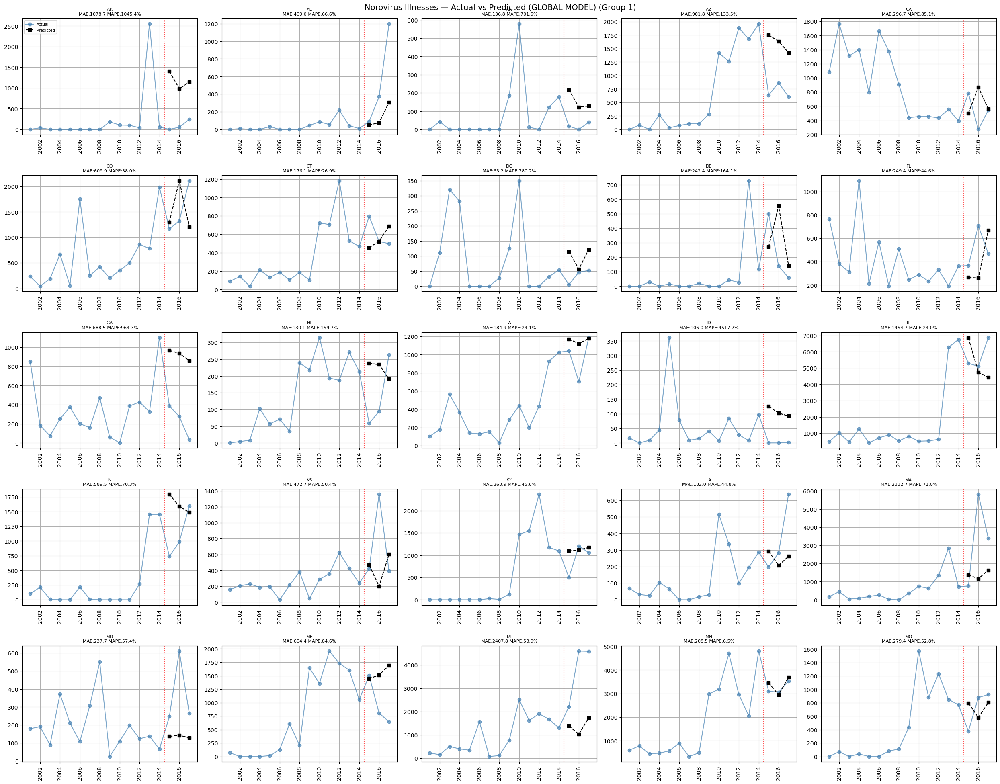

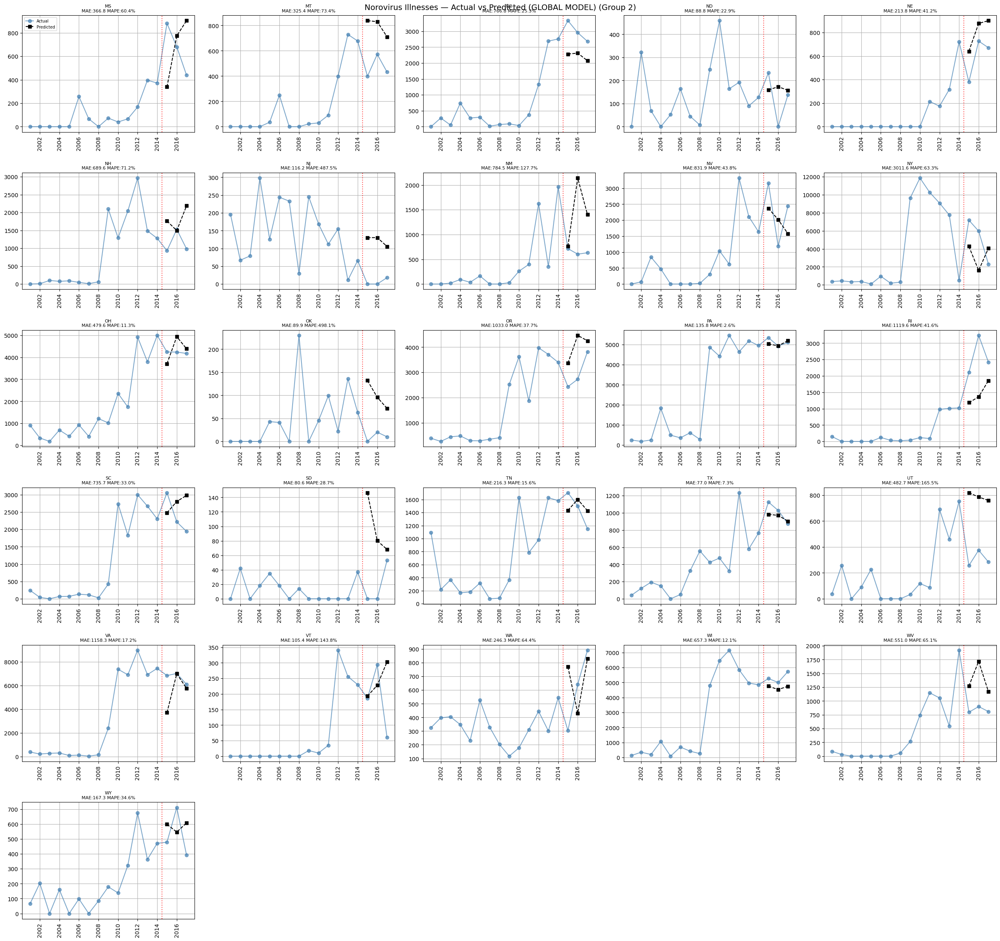

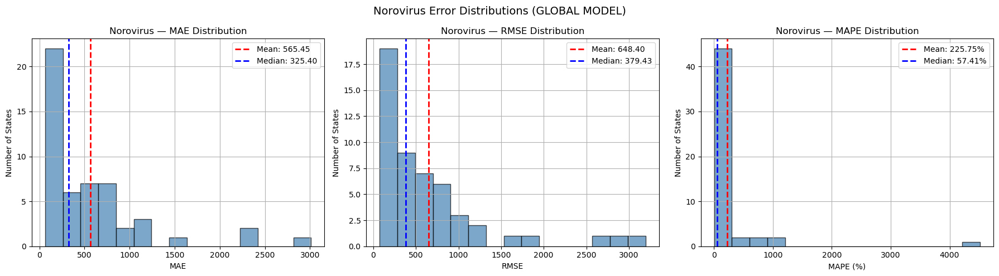


Norovirus Model Performance:
MAE  — Mean: 565.45  Median: 325.40
RMSE — Mean: 648.40  Median: 379.43
MAPE — Mean: 225.75%  Median: 57.41%
MAPE calculated for 51/51 states
Best state  (lowest MAE):  DC — MAE: 63.15
Worst state (highest MAE): NY — MAE: 3011.55


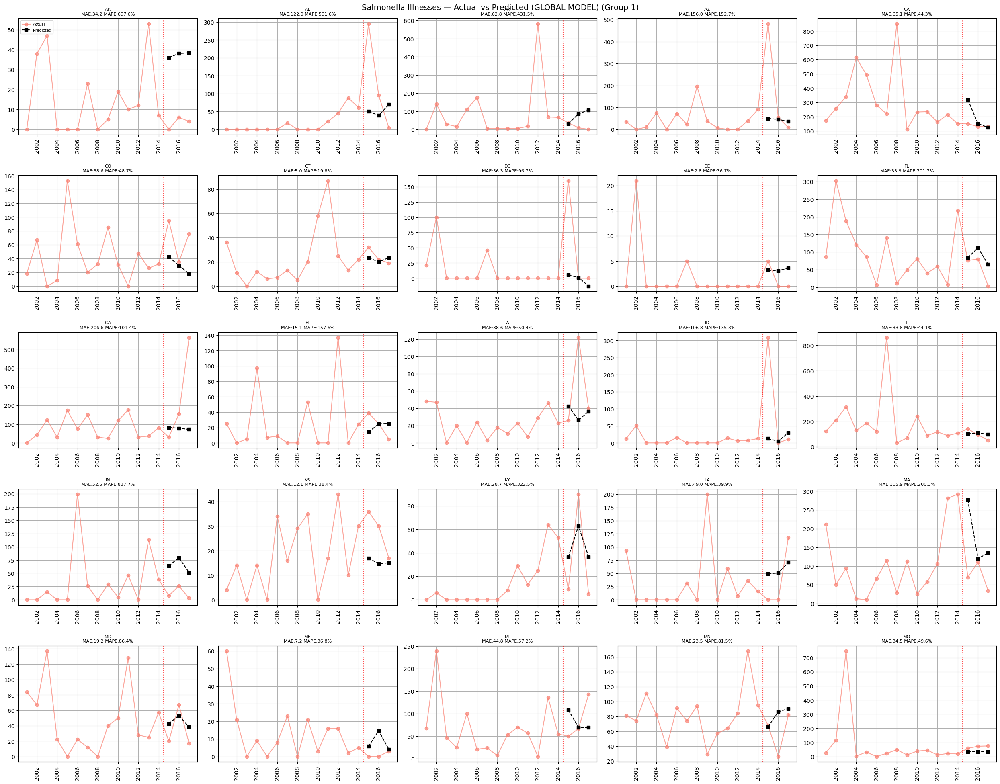

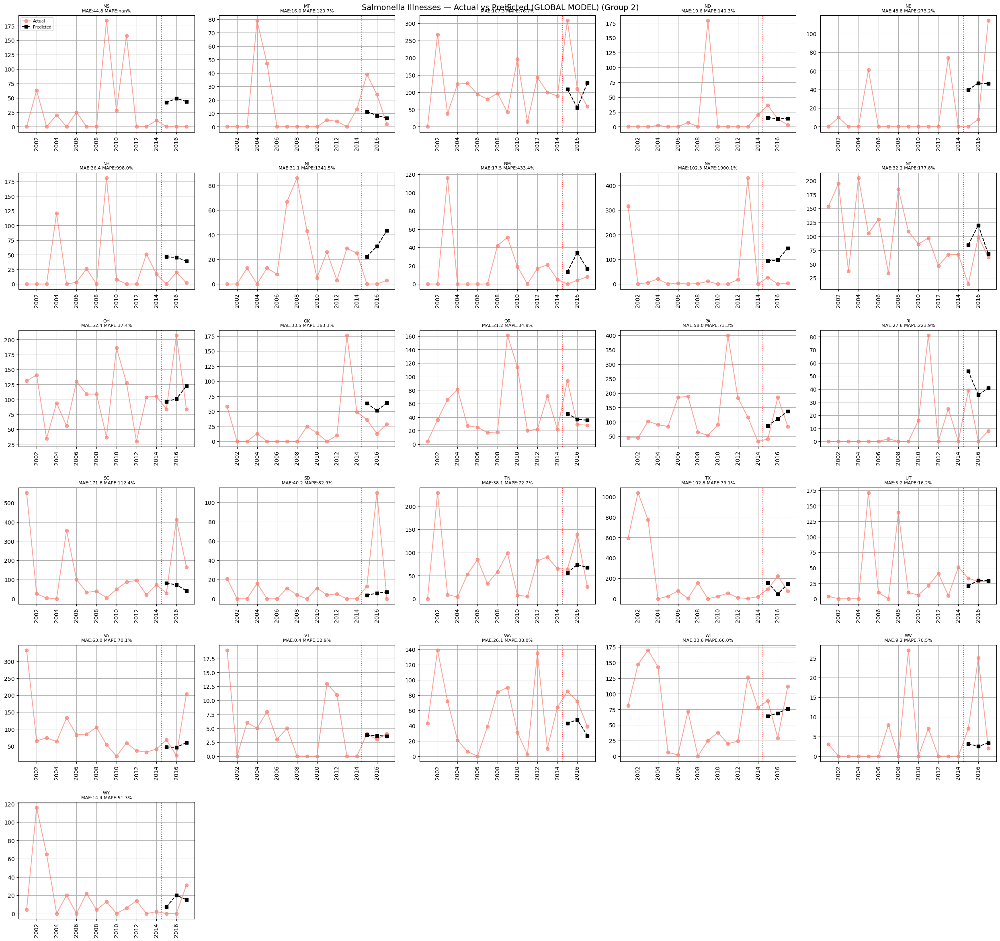

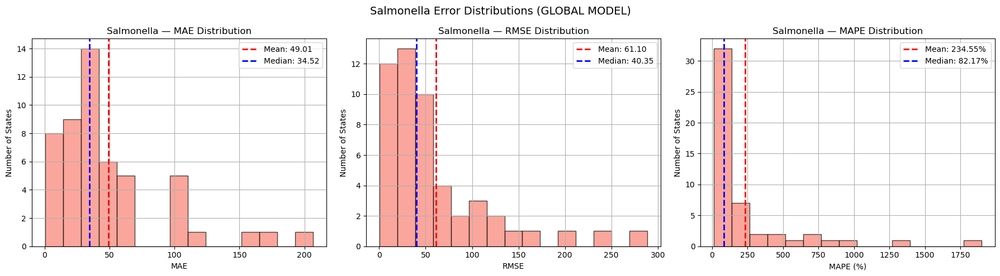


Salmonella Model Performance:
MAE  — Mean: 49.01  Median: 34.52
RMSE — Mean: 61.10  Median: 40.35
MAPE — Mean: 234.55%  Median: 82.17%
MAPE calculated for 50/51 states
Best state  (lowest MAE):  VT — MAE: 0.44
Worst state (highest MAE): GA — MAE: 206.57


In [5]:
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

def run_global_model(agg_full, etiology, color):

    # --- Filter etiology ---
    data = agg_full[
        agg_full['Etiology First Word'] == etiology
    ].sort_values(['State Abbrev', 'Year']).reset_index(drop=True)

    # --- Feature engineering  ---
    data['Lag 1'] = data.groupby('State Abbrev')['Illnesses'].shift(1)
    data['Lag 2'] = data.groupby('State Abbrev')['Illnesses'].shift(2)
    data['Lag 3'] = data.groupby('State Abbrev')['Illnesses'].shift(3)
    data['Rolling Avg 3'] = (
        data.groupby('State Abbrev')['Illnesses']
        .apply(lambda x: x.shift(1).rolling(3).mean())
        .reset_index(level=0, drop=True)
    )
    data['Trend'] = data['Lag 1'] - data['Lag 2']

    data = data.dropna().reset_index(drop=True)

    # --- IMPORTANT: categorical state ---
    data['State Abbrev'] = data['State Abbrev'].astype('category')

    # --- Train/test split (time-based) ---
    train = data[data['Year'] <= 2014]
    test  = data[data['Year'] > 2014]

    features = ['Year', 'Lag 1', 'Lag 2', 'Lag 3', 'Rolling Avg 3', 'Trend', 'State Abbrev']

    X_train = train[features]
    y_train = train['Illnesses']
    X_test  = test[features]
    y_test  = test['Illnesses']

    # --- MODEL (categorical enabled) ---
    model = xgb.XGBRegressor(
        n_estimators=200,
        learning_rate=0.05,
        max_depth=4,
        tree_method='hist',      # REQUIRED
        enable_categorical=True, # KEY
        random_state=42,
        verbosity=0
    )

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # --- Build results per state ---
    results = {}

    test = test.copy()
    test['Predicted'] = y_pred

    for state in test['State Abbrev'].cat.categories:
        state_df = test[test['State Abbrev'] == state]

        if len(state_df) == 0:
            continue

        actual = state_df['Illnesses'].values
        pred   = state_df['Predicted'].values
        years  = state_df['Year'].values

        relative_errors = np.where(
            actual != 0,
            np.abs(actual - pred) / actual * 100,
            np.nan
        )

        results[state] = {
            'actual':          actual,
            'predicted':       pred,
            'years':           years,
            'mae':             mean_absolute_error(actual, pred),
            'rmse':            mean_squared_error(actual, pred) ** 0.5,
            'relative_errors': relative_errors,
            'mape':            np.nanmean(relative_errors),
            'full_data':       data[data['State Abbrev'] == state]
        }

    # --- Actual vs Predicted Plots ---
    states_with_results = list(results.keys())
    midpoint = len(states_with_results) // 2
    group1 = states_with_results[:midpoint]
    group2 = states_with_results[midpoint:]

    for group_num, group in enumerate([group1, group2], 1):
        cols = 5
        rows = -(-len(group) // cols)
        fig, axes = plt.subplots(rows, cols, figsize=(25, rows * 4))
        axes = axes.flatten()

        for i, state in enumerate(group):
            r    = results[state]
            full = r['full_data']

            axes[i].plot(full['Year'], full['Illnesses'],
                         marker='o', color=color, label='Actual', alpha=0.7)
            axes[i].plot(r['years'], r['predicted'],
                         marker='s', color='black', linestyle='dashed', label='Predicted')
            axes[i].axvline(x=2014.5, color='red', linestyle='dotted', alpha=0.7)
            axes[i].set_title(f"{state}\nMAE:{r['mae']:.1f} MAPE:{r['mape']:.1f}%", fontsize=8)
            axes[i].grid(True)
            axes[i].tick_params(axis='x', rotation=90)

            if i == 0:
                axes[i].legend(fontsize=7)

        for j in range(len(group), len(axes)):
            axes[j].set_visible(False)

        plt.suptitle(f'{etiology} Illnesses — Actual vs Predicted (GLOBAL MODEL) (Group {group_num})', fontsize=14)
        plt.tight_layout()
        plt.show()

    # --- Collect errors  ---
    all_mae  = [r['mae']  for r in results.values()]
    all_rmse = [r['rmse'] for r in results.values()]
    all_mape = [r['mape'] for r in results.values() if not np.isnan(r['mape'])]

    # --- Error Distribution Plots  ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # MAE
    axes[0].hist(all_mae, bins=15, color=color, edgecolor='black', alpha=0.7)
    axes[0].axvline(np.mean(all_mae),   color='red',  linestyle='dashed', linewidth=2,
                    label=f"Mean: {np.mean(all_mae):.2f}")
    axes[0].axvline(np.median(all_mae), color='blue', linestyle='dashed', linewidth=2,
                    label=f"Median: {np.median(all_mae):.2f}")
    axes[0].set_title(f'{etiology} — MAE Distribution')
    axes[0].set_xlabel('MAE')
    axes[0].set_ylabel('Number of States')
    axes[0].legend()
    axes[0].grid(True)

    # RMSE
    axes[1].hist(all_rmse, bins=15, color=color, edgecolor='black', alpha=0.7)
    axes[1].axvline(np.mean(all_rmse),   color='red',  linestyle='dashed', linewidth=2,
                    label=f"Mean: {np.mean(all_rmse):.2f}")
    axes[1].axvline(np.median(all_rmse), color='blue', linestyle='dashed', linewidth=2,
                    label=f"Median: {np.median(all_rmse):.2f}")
    axes[1].set_title(f'{etiology} — RMSE Distribution')
    axes[1].set_xlabel('RMSE')
    axes[1].set_ylabel('Number of States')
    axes[1].legend()
    axes[1].grid(True)

    # MAPE
    axes[2].hist(all_mape, bins=15, color=color, edgecolor='black', alpha=0.7)
    axes[2].axvline(np.mean(all_mape),   color='red',  linestyle='dashed', linewidth=2,
                    label=f"Mean: {np.mean(all_mape):.2f}%")
    axes[2].axvline(np.median(all_mape), color='blue', linestyle='dashed', linewidth=2,
                    label=f"Median: {np.median(all_mape):.2f}%")
    axes[2].set_title(f'{etiology} — MAPE Distribution')
    axes[2].set_xlabel('MAPE (%)')
    axes[2].set_ylabel('Number of States')
    axes[2].legend()
    axes[2].grid(True)

    plt.suptitle(f'{etiology} Error Distributions (GLOBAL MODEL)', fontsize=14)
    plt.tight_layout()
    plt.show()

    # --- Performance Summary ---
    total_states       = len(results)
    valid_mape_states  = len(all_mape)

    print(f"\n{etiology} Model Performance:")
    print(f"MAE  — Mean: {np.mean(all_mae):.2f}  Median: {np.median(all_mae):.2f}")
    print(f"RMSE — Mean: {np.mean(all_rmse):.2f}  Median: {np.median(all_rmse):.2f}")
    print(f"MAPE — Mean: {np.mean(all_mape):.2f}%  Median: {np.median(all_mape):.2f}%")
    print(f"MAPE calculated for {valid_mape_states}/{total_states} states")
    print(f"Best state  (lowest MAE):  {min(results, key=lambda x: results[x]['mae'])} — MAE: {min(all_mae):.2f}")
    print(f"Worst state (highest MAE): {max(results, key=lambda x: results[x]['mae'])} — MAE: {max(all_mae):.2f}")

    return results  


# Run both models
all_years   = np.arange(agg_full['Year'].min(), agg_full['Year'].max() + 1)
noro_results = run_global_model(agg_full, 'Norovirus',  'steelblue')
salm_results = run_global_model(agg_full, 'Salmonella', 'salmon')


In [6]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

def plot_prediction_maps_side_by_side(results, etiology):
    # --- 1. Build combined dataframe ---
    rows = []
    for state, r in results.items():
        for i in range(len(r['years'])):
            rows.append({
                'State Abbrev': state,
                'Year': int(r['years'][i]),
                'Actual': float(r['actual'][i]),
                'Predicted': float(r['predicted'][i])
            })
    df_map = pd.DataFrame(rows)

    # --- 2. Compute error ---
    df_map['Error'] = df_map['Predicted'] - df_map['Actual']

    # --- 3. Filter for Last 3 years ---
    last_years = sorted(df_map['Year'].unique())[-3:]
    
    for year in last_years:
        df_year = df_map[df_map['Year'] == year].copy()
        
        # Ensure the color scale is symmetric for the Error map
        max_error = np.abs(df_year['Error']).max()
        if max_error == 0: max_error = 1  # Prevent division by zero

        # Create a figure for every year
        fig = go.Figure()

        # --- 4. LEFT MAP: ERROR ---
        fig.add_trace(go.Choropleth(
            locations=df_year['State Abbrev'],
            z=df_year['Error'],
            locationmode='USA-states',
            colorscale='RdBu',
            zmid=0,
            zmin=-max_error,
            zmax=max_error,
            geo='geo',  
            colorbar=dict(
                title="Error",
                x=0.01,           
                xanchor='right',
                thickness=15,
                len=0.5,          
                y=0.5             
            ),
            text=df_year.apply(lambda x: f"{x['State Abbrev']}<br>Error: {x['Error']:.1f}", axis=1),
            hoverinfo='text'
        ))

        # --- 5. RIGHT MAP: PREDICTED ) ---
        fig.add_trace(go.Choropleth(
            locations=df_year['State Abbrev'],
            z=df_year['Predicted'],
            locationmode='USA-states',
            colorscale='Blues',
            geo='geo2', 
            colorbar=dict(
                title="Predicted",
                x=0.5,            
                xanchor='center',
                thickness=15,
                len=0.5,
                y=0.5
            ),
            text=df_year.apply(lambda x: f"{x['State Abbrev']}<br>Pred: {x['Predicted']:.1f}", axis=1),
            hoverinfo='text'
        ))

        # --- 6. LAYOUT CONTROL ---
        fig.update_layout(
            title=dict(
                text=f"<b>{etiology} Model Performance ({year})</b>",
                x=0.3,
                y=0.75,
                xanchor='center',
                font=dict(size=22)
            ),
            # Define the space for the Left Map
            geo=dict(
                scope='usa',
                projection_type='albers usa',
                domain=dict(x=[0.05, 0.45], y=[.0000001, 1]), # Ends before the center
                showlakes=True,
                lakecolor='rgb(255, 255, 255)'
            ),
            # Define the space for the Right Map
            geo2=dict(
                scope='usa',
                projection_type='albers usa',
                domain=dict(
                    x=[0.55, 0.95], 
                    y=[0, 0.9]  # caps the height, lowering the map
                ),
                showlakes=True,
                lakecolor='rgb(255, 255, 255)'
            ),
            #  margins 
            margin=dict(l=1, r=500, t=120, b=50),
            width=1600, 
            height=700,
            showlegend=False
        )

        # --- 7.  Subtitles  ---
        fig.add_annotation(x=0.1, y=.75, text="<b>Prediction Error (Pred - Actual)</b>", 
                           showarrow=False, xref="paper", yref="paper", font=dict(size=16))
        fig.add_annotation(x=0.75, y=.75, text="<b>Predicted Total Values</b>", 
                           showarrow=False, xref="paper", yref="paper", font=dict(size=16))

        fig.show()

# --- Example usage (Make sure these variable names match your data) ---
plot_prediction_maps_side_by_side(noro_results, 'Norovirus')
plot_prediction_maps_side_by_side(salm_results, 'Salmonella')

In [7]:
import pandas as pd

pop_path = r"C:\Users\Avilaaa\Downloads\archive\US-population-by-state.csv"
df_pop = pd.read_csv(pop_path)

# Map full state names to abbreviations
state_to_abbrev = {
    'Alabama': 'AL', 'Alaska': 'AK', 'Arizona': 'AZ', 'Arkansas': 'AR', 'California': 'CA',
    'Colorado': 'CO', 'Connecticut': 'CT', 'Delaware': 'DE', 'Florida': 'FL', 'Georgia': 'GA',
    'Hawaii': 'HI', 'Idaho': 'ID', 'Illinois': 'IL', 'Indiana': 'IN', 'Iowa': 'IA',
    'Kansas': 'KS', 'Kentucky': 'KY', 'Louisiana': 'LA', 'Maine': 'ME', 'Maryland': 'MD',
    'Massachusetts': 'MA', 'Michigan': 'MI', 'Minnesota': 'MN', 'Mississippi': 'MS',
    'Missouri': 'MO', 'Montana': 'MT', 'Nebraska': 'NE', 'Nevada': 'NV', 'New Hampshire': 'NH',
    'New Jersey': 'NJ', 'New Mexico': 'NM', 'New York': 'NY', 'North Carolina': 'NC',
    'North Dakota': 'ND', 'Ohio': 'OH', 'Oklahoma': 'OK', 'Oregon': 'OR', 'Pennsylvania': 'PA',
    'Rhode Island': 'RI', 'South Carolina': 'SC', 'South Dakota': 'SD', 'Tennessee': 'TN',
    'Texas': 'TX', 'Utah': 'UT', 'Vermont': 'VT', 'Virginia': 'VA', 'Washington': 'WA',
    'West Virginia': 'WV', 'Wisconsin': 'WI', 'Wyoming': 'WY'
}

df_pop['State Abbrev'] = df_pop['state'].map(state_to_abbrev)

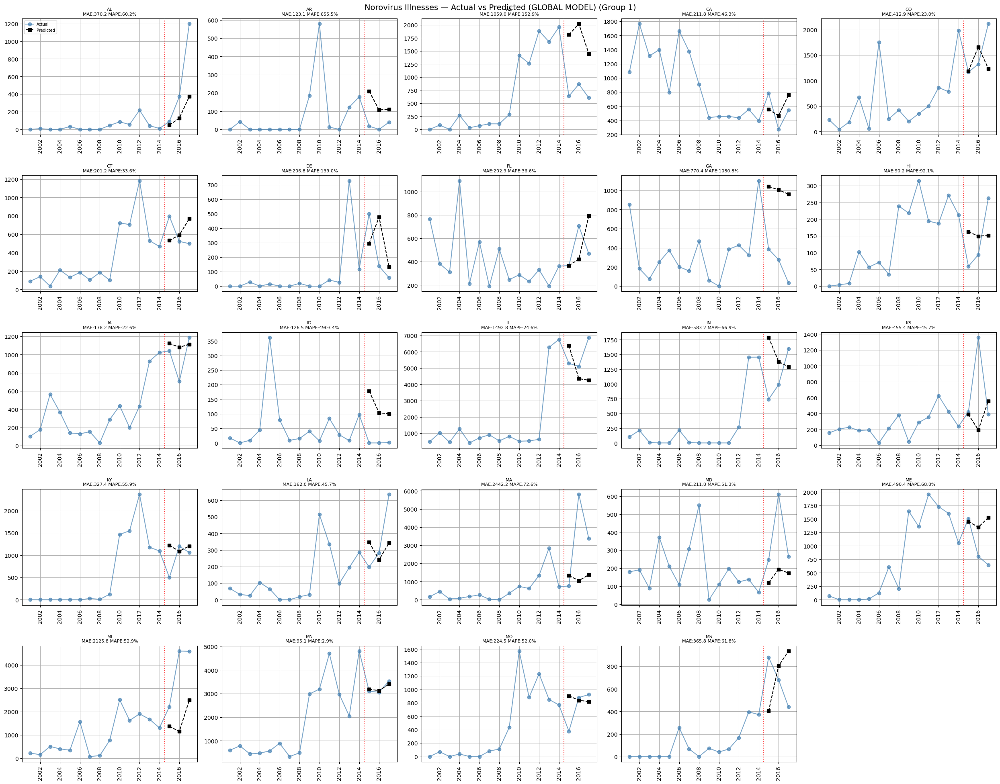

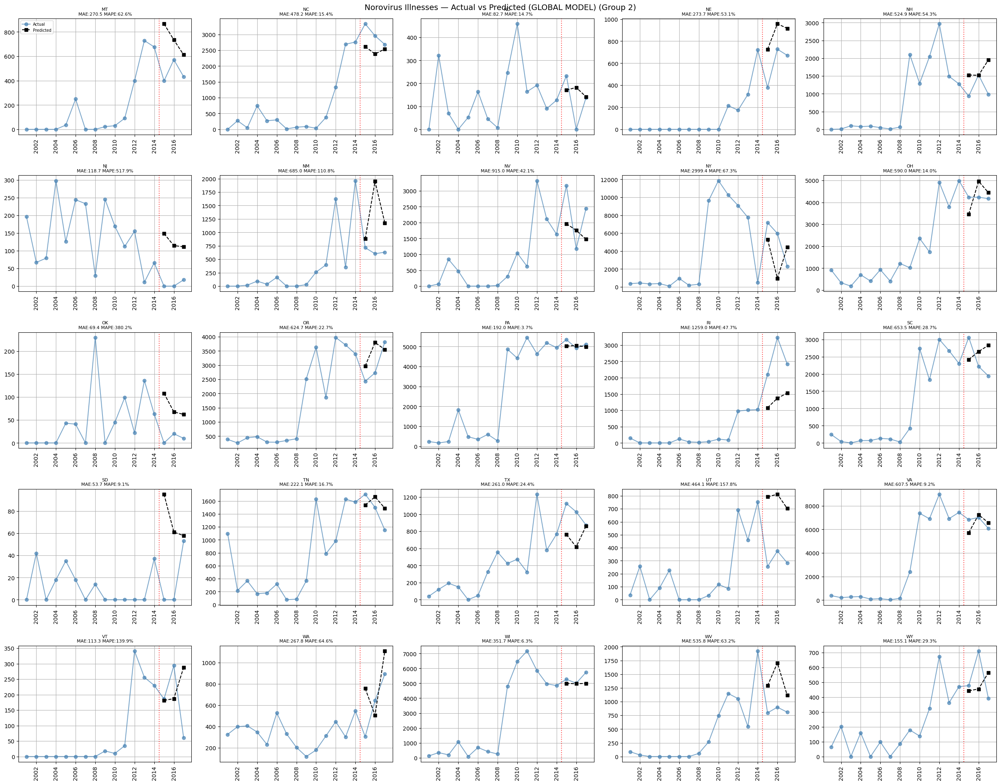

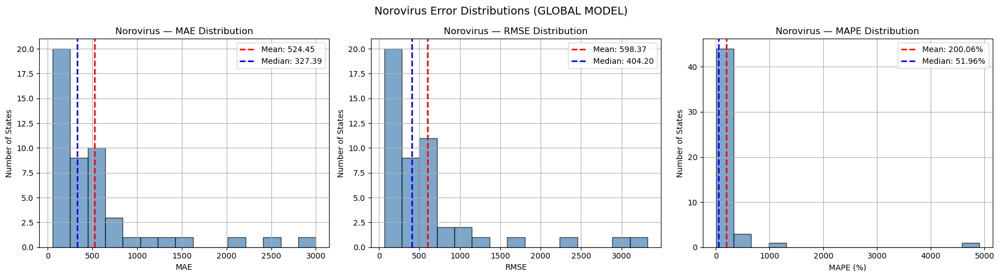


Norovirus Model Performance:
MAE  — Mean: 524.45  Median: 327.39
RMSE — Mean: 598.37  Median: 404.20
MAPE — Mean: 200.06%  Median: 51.96%
MAPE calculated for 49/49 states
Best state  (lowest MAE):  SD — MAE: 53.70
Worst state (highest MAE): NY — MAE: 2999.36


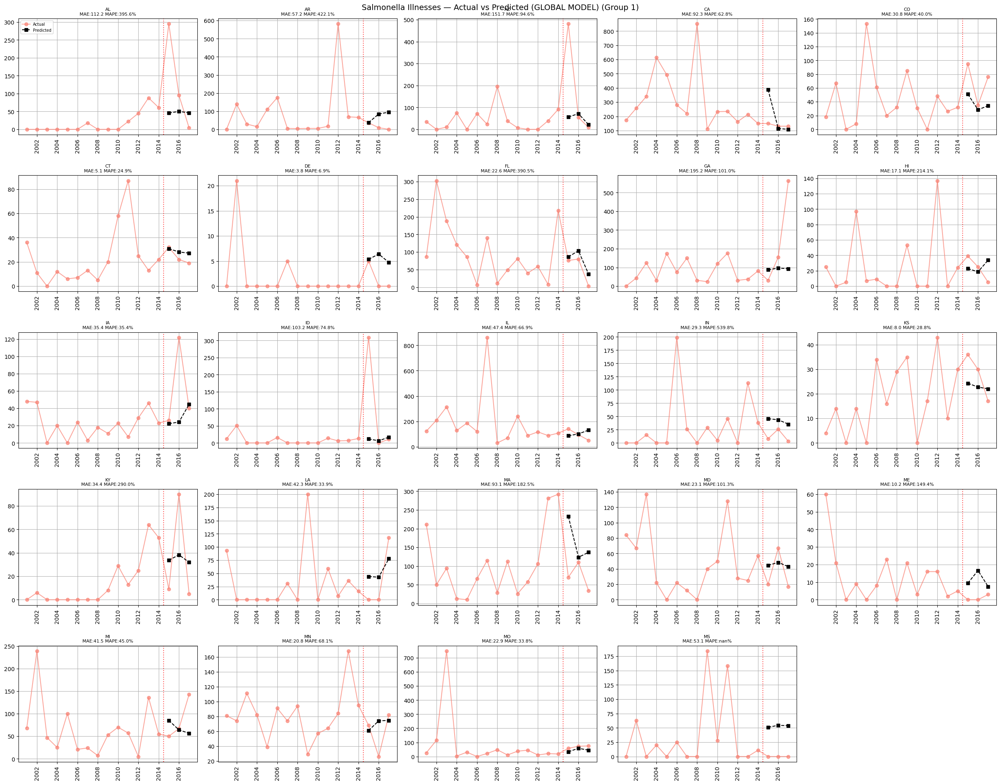

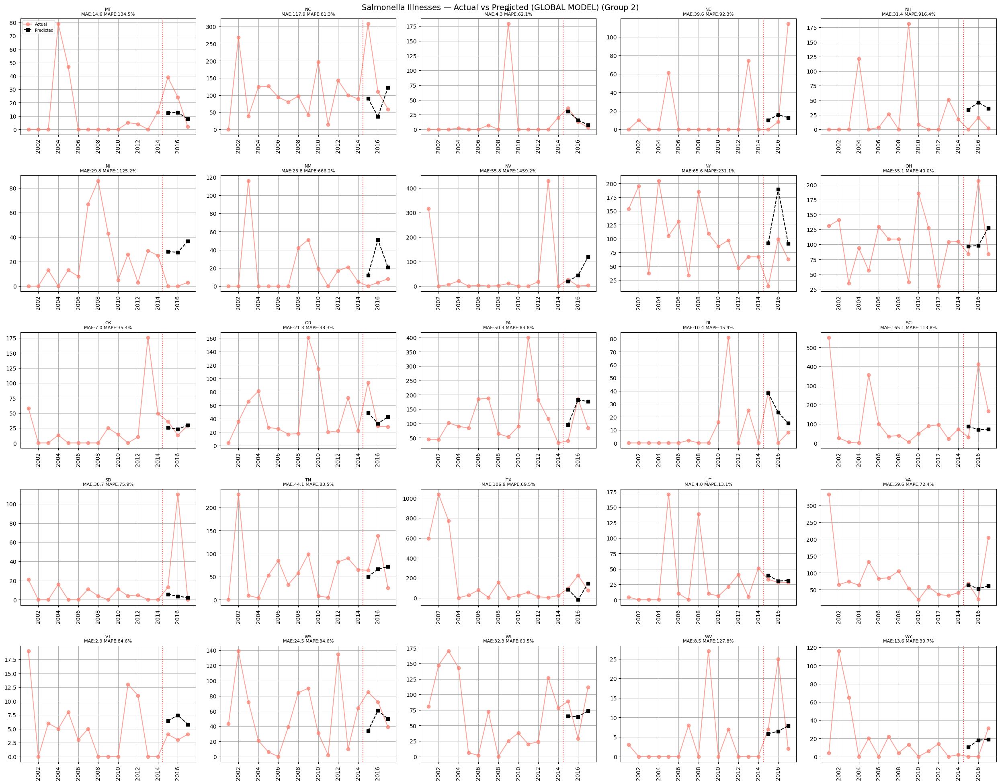

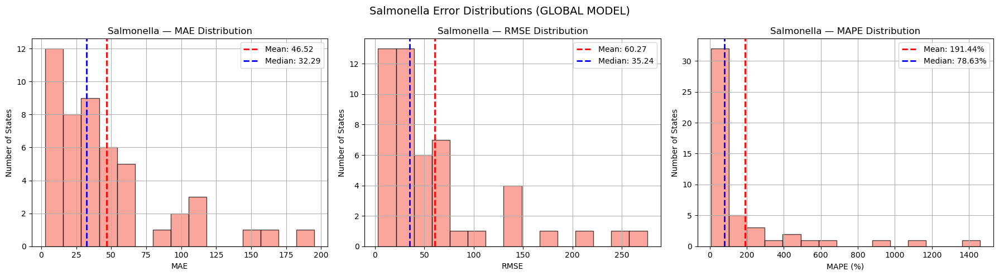


Salmonella Model Performance:
MAE  — Mean: 46.52  Median: 32.29
RMSE — Mean: 60.27  Median: 35.24
MAPE — Mean: 191.44%  Median: 78.63%
MAPE calculated for 48/49 states
Best state  (lowest MAE):  VT — MAE: 2.89
Worst state (highest MAE): GA — MAE: 195.16


In [8]:
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, mean_squared_error
import warnings
warnings.filterwarnings('ignore')

def run_global_model(agg_full, etiology, color):

    # --- Filter etiology ---
    data = agg_full[
        agg_full['Etiology First Word'] == etiology
    ].sort_values(['State Abbrev', 'Year']).reset_index(drop=True)
    # --- Merge population data ---
    data = pd.merge(
    data,
    df_pop[['State Abbrev', 'year', 'population']],
    left_on=['State Abbrev', 'Year'],
    right_on=['State Abbrev', 'year'],
    how='left'
    )

    # Drop redundant column
    data = data.drop(columns=['year'])
    # --- Feature engineering  ---
    data['Lag 1'] = data.groupby('State Abbrev')['Illnesses'].shift(1)
    data['Lag 2'] = data.groupby('State Abbrev')['Illnesses'].shift(2)
    data['Lag 3'] = data.groupby('State Abbrev')['Illnesses'].shift(3)
    data['Rolling Avg 3'] = (
        data.groupby('State Abbrev')['Illnesses']
        .apply(lambda x: x.shift(1).rolling(3).mean())
        .reset_index(level=0, drop=True)
    )
    data['Trend'] = data['Lag 1'] - data['Lag 2']

    data = data.dropna().reset_index(drop=True)

    # --- IMPORTANT: categorical state ---
    data['State Abbrev'] = data['State Abbrev'].astype('category')

    # --- Train/test split (time-based) ---
    train = data[data['Year'] <= 2014]
    test  = data[data['Year'] > 2014]

    features = ['Year', 'Lag 1', 'Lag 2', 'Lag 3', 'Rolling Avg 3', 'Trend', 'State Abbrev', 'population']

    X_train = train[features]
    y_train = train['Illnesses']
    X_test  = test[features]
    y_test  = test['Illnesses']

    # --- MODEL (categorical enabled) ---
    model = xgb.XGBRegressor(
        n_estimators=200,
        learning_rate=0.05,
        max_depth=4,
        tree_method='hist',      # REQUIRED
        enable_categorical=True, # KEY
        random_state=42,
        verbosity=0
    )

    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # --- Build results per state ---
    results = {}

    test = test.copy()
    test['Predicted'] = y_pred

    for state in test['State Abbrev'].cat.categories:
        state_df = test[test['State Abbrev'] == state]

        if len(state_df) == 0:
            continue

        actual = state_df['Illnesses'].values
        pred   = state_df['Predicted'].values
        years  = state_df['Year'].values

        relative_errors = np.where(
            actual != 0,
            np.abs(actual - pred) / actual * 100,
            np.nan
        )

        results[state] = {
            'actual':          actual,
            'predicted':       pred,
            'years':           years,
            'mae':             mean_absolute_error(actual, pred),
            'rmse':            mean_squared_error(actual, pred) ** 0.5,
            'relative_errors': relative_errors,
            'mape':            np.nanmean(relative_errors),
            'full_data':       data[data['State Abbrev'] == state]
        }

    # --- Actual vs Predicted Plots ---
    states_with_results = list(results.keys())
    midpoint = len(states_with_results) // 2
    group1 = states_with_results[:midpoint]
    group2 = states_with_results[midpoint:]

    for group_num, group in enumerate([group1, group2], 1):
        cols = 5
        rows = -(-len(group) // cols)
        fig, axes = plt.subplots(rows, cols, figsize=(25, rows * 4))
        axes = axes.flatten()

        for i, state in enumerate(group):
            r    = results[state]
            full = r['full_data']

            axes[i].plot(full['Year'], full['Illnesses'],
                         marker='o', color=color, label='Actual', alpha=0.7)
            axes[i].plot(r['years'], r['predicted'],
                         marker='s', color='black', linestyle='dashed', label='Predicted')
            axes[i].axvline(x=2014.5, color='red', linestyle='dotted', alpha=0.7)
            axes[i].set_title(f"{state}\nMAE:{r['mae']:.1f} MAPE:{r['mape']:.1f}%", fontsize=8)
            axes[i].grid(True)
            axes[i].tick_params(axis='x', rotation=90)

            if i == 0:
                axes[i].legend(fontsize=7)

        for j in range(len(group), len(axes)):
            axes[j].set_visible(False)

        plt.suptitle(f'{etiology} Illnesses — Actual vs Predicted (GLOBAL MODEL) (Group {group_num})', fontsize=14)
        plt.tight_layout()
        plt.show()

    # --- Collect errors  ---
    all_mae  = [r['mae']  for r in results.values()]
    all_rmse = [r['rmse'] for r in results.values()]
    all_mape = [r['mape'] for r in results.values() if not np.isnan(r['mape'])]

    # --- Error Distribution Plots  ---
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))

    # MAE
    axes[0].hist(all_mae, bins=15, color=color, edgecolor='black', alpha=0.7)
    axes[0].axvline(np.mean(all_mae),   color='red',  linestyle='dashed', linewidth=2,
                    label=f"Mean: {np.mean(all_mae):.2f}")
    axes[0].axvline(np.median(all_mae), color='blue', linestyle='dashed', linewidth=2,
                    label=f"Median: {np.median(all_mae):.2f}")
    axes[0].set_title(f'{etiology} — MAE Distribution')
    axes[0].set_xlabel('MAE')
    axes[0].set_ylabel('Number of States')
    axes[0].legend()
    axes[0].grid(True)

    # RMSE
    axes[1].hist(all_rmse, bins=15, color=color, edgecolor='black', alpha=0.7)
    axes[1].axvline(np.mean(all_rmse),   color='red',  linestyle='dashed', linewidth=2,
                    label=f"Mean: {np.mean(all_rmse):.2f}")
    axes[1].axvline(np.median(all_rmse), color='blue', linestyle='dashed', linewidth=2,
                    label=f"Median: {np.median(all_rmse):.2f}")
    axes[1].set_title(f'{etiology} — RMSE Distribution')
    axes[1].set_xlabel('RMSE')
    axes[1].set_ylabel('Number of States')
    axes[1].legend()
    axes[1].grid(True)

    # MAPE
    axes[2].hist(all_mape, bins=15, color=color, edgecolor='black', alpha=0.7)
    axes[2].axvline(np.mean(all_mape),   color='red',  linestyle='dashed', linewidth=2,
                    label=f"Mean: {np.mean(all_mape):.2f}%")
    axes[2].axvline(np.median(all_mape), color='blue', linestyle='dashed', linewidth=2,
                    label=f"Median: {np.median(all_mape):.2f}%")
    axes[2].set_title(f'{etiology} — MAPE Distribution')
    axes[2].set_xlabel('MAPE (%)')
    axes[2].set_ylabel('Number of States')
    axes[2].legend()
    axes[2].grid(True)

    plt.suptitle(f'{etiology} Error Distributions (GLOBAL MODEL)', fontsize=14)
    plt.tight_layout()
    plt.show()

    # --- Performance Summary ---
    total_states       = len(results)
    valid_mape_states  = len(all_mape)

    print(f"\n{etiology} Model Performance:")
    print(f"MAE  — Mean: {np.mean(all_mae):.2f}  Median: {np.median(all_mae):.2f}")
    print(f"RMSE — Mean: {np.mean(all_rmse):.2f}  Median: {np.median(all_rmse):.2f}")
    print(f"MAPE — Mean: {np.mean(all_mape):.2f}%  Median: {np.median(all_mape):.2f}%")
    print(f"MAPE calculated for {valid_mape_states}/{total_states} states")
    print(f"Best state  (lowest MAE):  {min(results, key=lambda x: results[x]['mae'])} — MAE: {min(all_mae):.2f}")
    print(f"Worst state (highest MAE): {max(results, key=lambda x: results[x]['mae'])} — MAE: {max(all_mae):.2f}")

    return results  


# Run both models
all_years   = np.arange(agg_full['Year'].min(), agg_full['Year'].max() + 1)
noro_results = run_global_model(agg_full, 'Norovirus',  'steelblue')
salm_results = run_global_model(agg_full, 'Salmonella', 'salmon')


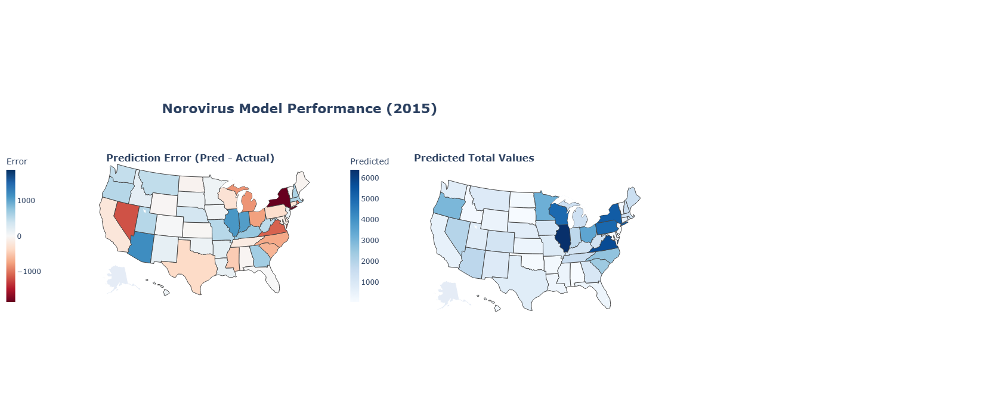

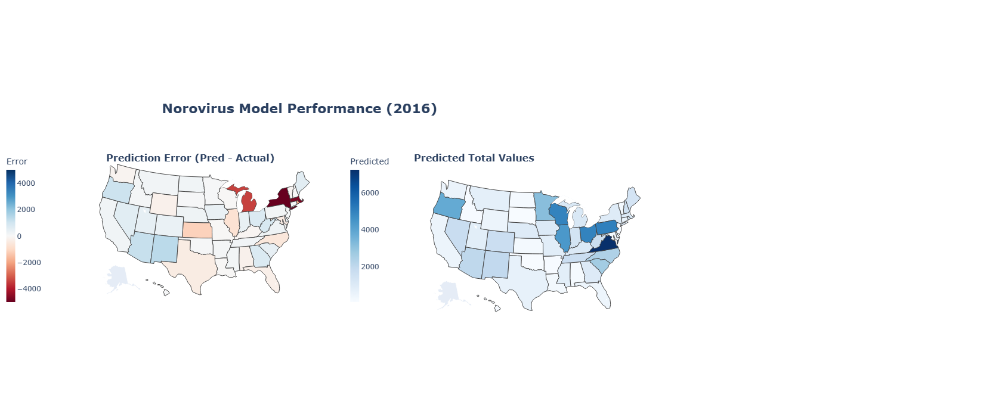

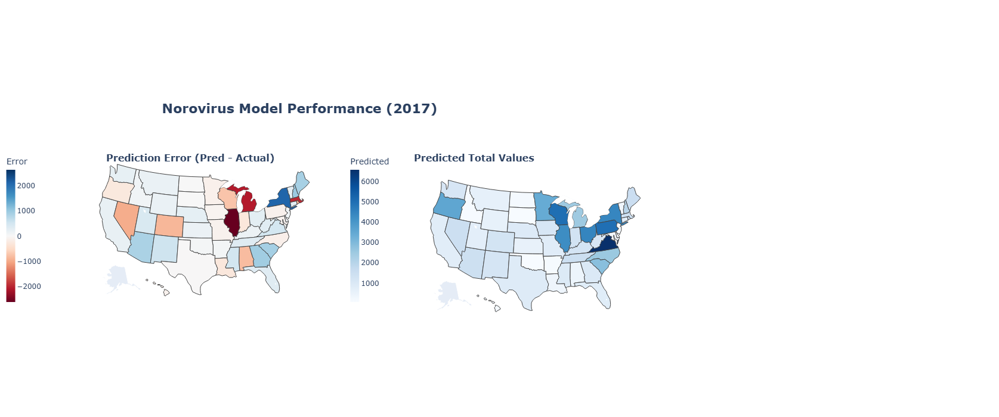

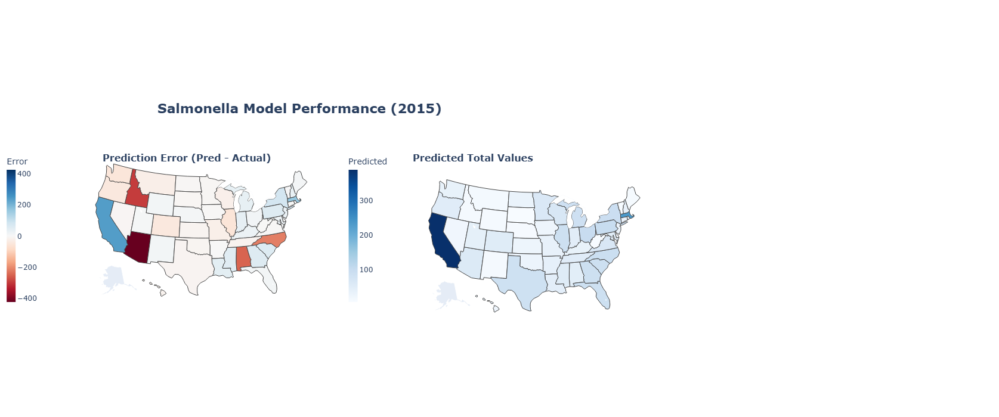

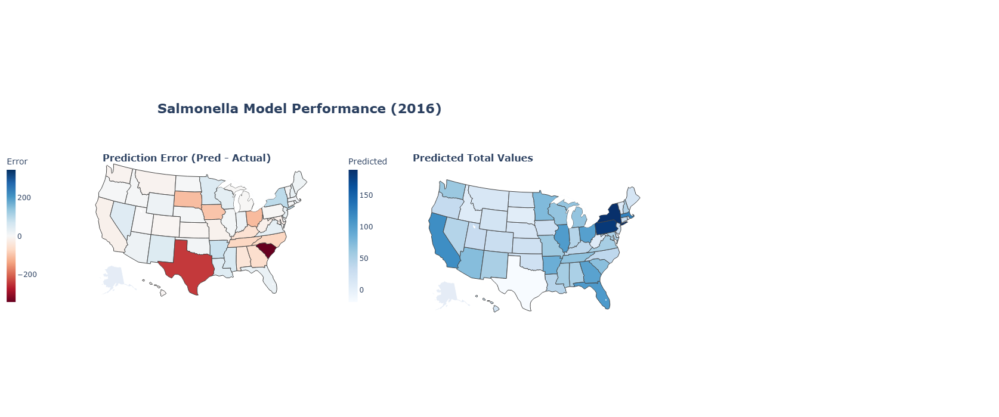

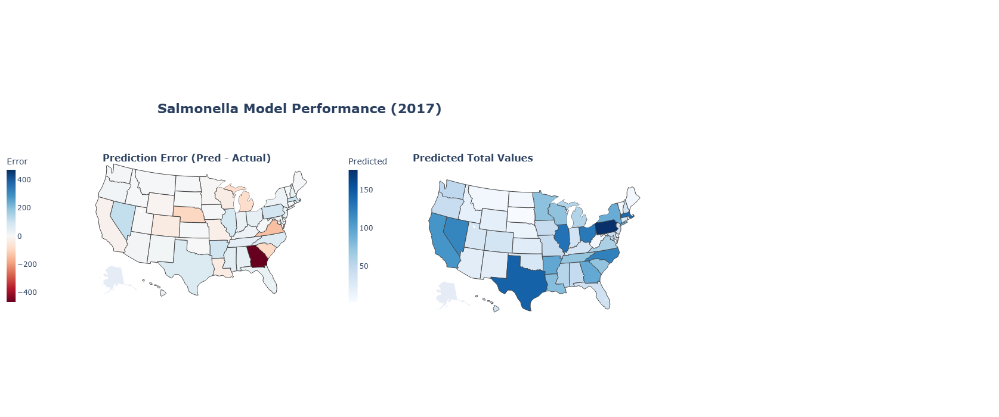

In [9]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go

def plot_prediction_maps_side_by_side(results, etiology):
    # --- 1. Build combined dataframe ---
    rows = []
    for state, r in results.items():
        for i in range(len(r['years'])):
            rows.append({
                'State Abbrev': state,
                'Year': int(r['years'][i]),
                'Actual': float(r['actual'][i]),
                'Predicted': float(r['predicted'][i])
            })
    df_map = pd.DataFrame(rows)

    # --- 2. Compute error ---
    df_map['Error'] = df_map['Predicted'] - df_map['Actual']

    # --- 3. Filter for Last 3 years ---
    last_years = sorted(df_map['Year'].unique())[-3:]
    
    for year in last_years:
        df_year = df_map[df_map['Year'] == year].copy()
        
        # Ensure the color scale is symmetric for the Error map
        max_error = np.abs(df_year['Error']).max()
        if max_error == 0: max_error = 1  # Prevent division by zero

        # Create a figure for every year
        fig = go.Figure()

        # --- 4. LEFT MAP: ERROR ---
        fig.add_trace(go.Choropleth(
            locations=df_year['State Abbrev'],
            z=df_year['Error'],
            locationmode='USA-states',
            colorscale='RdBu',
            zmid=0,
            zmin=-max_error,
            zmax=max_error,
            geo='geo',  
            colorbar=dict(
                title="Error",
                x=0.01,           
                xanchor='right',
                thickness=15,
                len=0.5,          
                y=0.5             
            ),
            text=df_year.apply(lambda x: f"{x['State Abbrev']}<br>Error: {x['Error']:.1f}", axis=1),
            hoverinfo='text'
        ))

        # --- 5. RIGHT MAP: PREDICTED ) ---
        fig.add_trace(go.Choropleth(
            locations=df_year['State Abbrev'],
            z=df_year['Predicted'],
            locationmode='USA-states',
            colorscale='Blues',
            geo='geo2', 
            colorbar=dict(
                title="Predicted",
                x=0.5,            
                xanchor='center',
                thickness=15,
                len=0.5,
                y=0.5
            ),
            text=df_year.apply(lambda x: f"{x['State Abbrev']}<br>Pred: {x['Predicted']:.1f}", axis=1),
            hoverinfo='text'
        ))

        # --- 6. LAYOUT CONTROL ---
        fig.update_layout(
            title=dict(
                text=f"<b>{etiology} Model Performance ({year})</b>",
                x=0.3,
                y=0.75,
                xanchor='center',
                font=dict(size=22)
            ),
            # Define the space for the Left Map
            geo=dict(
                scope='usa',
                projection_type='albers usa',
                domain=dict(x=[0.05, 0.45], y=[.0000001, 1]), # Ends before the center
                showlakes=True,
                lakecolor='rgb(255, 255, 255)'
            ),
            # Define the space for the Right Map
            geo2=dict(
                scope='usa',
                projection_type='albers usa',
                domain=dict(
                    x=[0.55, 0.95], 
                    y=[0, 0.9]  # caps the height, lowering the map
                ),
                showlakes=True,
                lakecolor='rgb(255, 255, 255)'
            ),
            #  margins 
            margin=dict(l=1, r=500, t=120, b=50),
            width=1600, 
            height=700,
            showlegend=False
        )

        # --- 7.  Subtitles  ---
        fig.add_annotation(x=0.1, y=.75, text="<b>Prediction Error (Pred - Actual)</b>", 
                           showarrow=False, xref="paper", yref="paper", font=dict(size=16))
        fig.add_annotation(x=0.75, y=.75, text="<b>Predicted Total Values</b>", 
                           showarrow=False, xref="paper", yref="paper", font=dict(size=16))

        fig.show()

# --- Example usage (Make sure these variable names match your data) ---
plot_prediction_maps_side_by_side(noro_results, 'Norovirus')
plot_prediction_maps_side_by_side(salm_results, 'Salmonella')